In [42]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, WhiteKernel
from scipy.stats import norm

# --- Data Handling ---
def load_data(file_path="averages_combined.csv"):
    """Load dataset and validate required columns."""
    df = pd.read_csv(file_path)
    required_columns = ['A', 'B', 'C', 'T', 'c_cna']
    if not all(col in df.columns for col in required_columns):
        raise ValueError(f"CSV must contain columns: {required_columns}")
    return df

def generate_config_space(df=None, step=None, min_val=None, max_val=None):
    """
    Generate configuration space for compositions (N_A, N_B, N_C).
    If df is provided, derives unique compositions from data; otherwise, generates grid-based space.
    """
    if df is not None:
        # Extract unique compositions from data
        compositions = df[['A', 'B', 'C']].drop_duplicates().values
        return np.array(compositions)
    
    # Generate grid-based configuration space
    if step is None or min_val is None or max_val is None:
        raise ValueError("Must provide step, min_val, and max_val when df is None")
    
    values = np.arange(min_val, max_val + 1, step)
    config_space = []
    for na in values:
        for nb in values:
            nc = 1000 - na - nb
            if nc >= min_val and nc <= max_val:
                config_space.append([na, nb, nc])
    return np.array(config_space)

def get_averaged_c_cna_data(config_space, temperature, df):
    """Compute averaged c_cna for a given temperature and configuration space."""
    c_cna_values = []
    for na, nb, nc in config_space:
        config_data = df[(df['A'] == na) & 
                        (df['B'] == nb) & 
                        (df['C'] == nc) & 
                        (df['T'] == temperature)]
        mean_c_cna = config_data['c_cna'].mean() if not config_data.empty else np.nan
        c_cna_values.append(mean_c_cna)
    return np.array(c_cna_values)

# --- GPR and Interpolation ---
def train_gpr_interpolator(temperature, df, kernel):
    """Train GPR on all available data for a given temperature with specified kernel."""
    # Group by composition and average c_cna for the given temperature
    data = df[df['T'] == temperature][['A', 'B', 'C', 'c_cna']].groupby(['A', 'B', 'C']).mean().reset_index()
    X_train = data[['A', 'B', 'C']].values
    y_train = data['c_cna'].values
    
    if len(X_train) == 0:
        raise ValueError(f"No data available for temperature {temperature}")
    
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=5)
    gp.fit(X_train, y_train)
    
    # Clamp predictions to [0, 1]
    original_predict = gp.predict
    def clamped_predict(X, return_std=False):
        mu, sigma = original_predict(X, return_std=True)
        mu = np.clip(mu, 0, 1)
        if return_std:
            return mu, sigma
        return mu
    gp.predict = clamped_predict
    
    return gp, X_train, y_train

# --- Bayesian Optimization ---
def expected_improvement(X, gp, best_y, xi):
    """Compute Expected Improvement acquisition function."""
    mu, sigma = gp.predict(X, return_std=True)
    mu = mu.reshape(-1)
    sigma = sigma.reshape(-1)
    
    with np.errstate(divide='warn'):
        Z = (best_y - mu - xi) / sigma
        ei = (best_y - mu - xi) * norm.cdf(Z) + sigma * norm.pdf(Z)
        ei[sigma == 0.0] = 0.0
    
    return ei

def bayesian_optimization(config_space, bo_config_space, initial_points, n_iterations, temperature, df, true_gp, xi):
    """Run Bayesian Optimization with Expected Improvement."""
    X_train = np.array(initial_points)
    y_train = true_gp.predict(X_train)
    
    results = []
    for i in range(n_iterations):
        #kernel = ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3)) + WhiteKernel(noise_level=0.0001, noise_level_bounds=(1e-7, 1e-1))
        kernel = ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3))
        gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=5)
        gp.fit(X_train, y_train)
        
        # Clamp predictions to [0, 1]
        original_gp_predict = gp.predict
        def clamped_gp_predict(X, return_std=False):
            mu, sigma = original_gp_predict(X, return_std=True)
            mu = np.clip(mu, 0, 1)
            if return_std:
                return mu, sigma
            return mu
        gp.predict = clamped_gp_predict
        
        best_y = np.min(y_train)
        ei = expected_improvement(bo_config_space, gp, best_y, xi)
        next_idx = np.argmax(ei)
        next_point = bo_config_space[next_idx]
        
        next_y = true_gp.predict([next_point])[0]
        
        mu_step_1, sigma_step_1 = gp.predict(config_space, return_std=True)
        
        X_train = np.vstack([X_train, next_point])
        y_train = np.append(y_train, next_y)
        
        results.append({
            'iteration': i,
            'X_train': X_train.copy(),
            'y_train': y_train.copy(),
            'mu_step_1': mu_step_1,
            'sigma_step_1': sigma_step_1,
            'ei': ei,
            'next_point': next_point,
            'next_y': next_y
        })
    
    return results

# --- Plotting Utilities ---
def plot_scatter(ax, x, y, c, s=0.2, cmap='viridis', vmin=None, vmax=None, sampled_points=None, label=None):
    """Create a scatter plot on the given axis with optional sampled points."""
    valid = ~np.isnan(c)
    sc = None
    if np.any(valid):
        sc = ax.scatter(x[valid], y[valid], c=c[valid], s=s, cmap=cmap, vmin=vmin, vmax=vmax)
    
    if sampled_points is not None and label:
        x_samp, y_samp = sampled_points
        ax.scatter(x_samp, y_samp, c='red', marker='x', s=50, label=label)
        ax.legend()
    
    return sc

def add_colorbar(fig, ax, sc, label):
    """Add a colorbar to the figure for the given scatter plot."""
    if sc is not None:
        fig.colorbar(sc, ax=ax, label=label)

def format_axes(ax, xlabel='NC', ylabel='NA', title=''):
    """Format axes with labels and title."""
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

# --- Interpolation Comparison Plot ---
def plot_interpolation_comparison(temperature, df, config_space_step_1, output_dir='plots', save_plots=True):
    """Plot raw data and interpolations with different GPR kernels in a 2x2 figure."""
    vmin, vmax = 0, 1
    marker_size = 0.2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Initialize 2x2 subplot figure
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.flatten()
    
    # Plot 1: Raw data (no interpolation)
    data = df[df['T'] == temperature][['A', 'B', 'C', 'c_cna']].groupby(['A', 'B', 'C']).mean().reset_index()
    X_raw = data[['A', 'B', 'C']].values
    y_raw = data['c_cna'].values
    ax = axes[0]
    sc = plot_scatter(ax, X_raw[:, 2], X_raw[:, 0], y_raw, s=200, vmin=vmin, vmax=vmax)
    add_colorbar(fig, ax, sc, 'c_cna')
    format_axes(ax, title='Raw Data')
    
    # Define kernels for interpolation
    kernels = [
        # Kernel 1: No WhiteKernel
        ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3)),
        # Kernel 2: With WhiteKernel (default parameters)
        ConstantKernel(1.0) * RBF(length_scale=50, length_scale_bounds=(1e-2, 1e3)) + 
        WhiteKernel(noise_level=0.000001, noise_level_bounds=(1e-8, 1e-1)),
        # Kernel 3: With WhiteKernel (different parameters)
        ConstantKernel(1.0) * RBF(length_scale=50, length_scale_bounds=(1e-1, 1e3)) + 
        WhiteKernel(noise_level=0.001, noise_level_bounds=(1e-6, 1e-2))
    ]
    kernel_titles = [
        'Interpolation: RBF Only',
        'Interpolation: RBF + WhiteKernel (noise=0.0001)',
        'Interpolation: RBF + WhiteKernel (noise=0.001, length_scale=50)'
    ]
    
    # Plots 2-4: Interpolations with different kernels
    for i, (kernel, title) in enumerate(zip(kernels[0:3], kernel_titles), start=1):
        ax = axes[i]
        gp, _, _ = train_gpr_interpolator(temperature, df, kernel)
        y_pred = gp.predict(config_space_step_1)
        sc = plot_scatter(ax, config_space_step_1[:, 2], config_space_step_1[:, 0], y_pred, 
                         s=marker_size, vmin=vmin, vmax=vmax)
        add_colorbar(fig, ax, sc, 'c_cna')
        format_axes(ax, title=title)
    
    # Adjust layout and save
    plt.suptitle(f'Interpolation Comparison (T={temperature})')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if save_plots:
        plt.savefig(os.path.join(output_dir, 'interpolation_comparison.png'), dpi=300)
    plt.show()
    plt.close()

# --- Task 1: Simple BO Process Visualization ---
def plot_bo_process(true_values, bo_results, config_space, temperature, plot_iterations, output_dir='plots', save_plots=True):
    """Plot true function and BO predictions across iterations."""
    vmin, vmax = 0, 1
    marker_size = 0.2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Determine subplot grid (4 plots per row)
    n_plots = len(plot_iterations) + 1  # True function + iterations
    ncols = 4
    nrows = int(np.ceil(n_plots / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))
    axes = axes.flatten()
    
    # Plot true function
    ax = axes[0]
    sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], true_values, 
                     s=marker_size, vmin=vmin, vmax=vmax)
    add_colorbar(fig, ax, sc, 'c_cna')
    format_axes(ax, title='True Function (Step 1)')
    
    # Plot BO predictions
    for i, iter_idx in enumerate(plot_iterations):
        ax = axes[i + 1]
        result = bo_results[iter_idx]
        mu_step_1 = result['mu_step_1']
        X_train = result['X_train']
        
        sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], mu_step_1, 
                         s=marker_size, vmin=vmin, vmax=vmax, 
                         sampled_points=(X_train[:, 2], X_train[:, 0]), label='Sampled')
        add_colorbar(fig, ax, sc, 'Predicted c_cna')
        format_axes(ax, title=f'Iteration {iter_idx}')
    
    # Remove empty subplots
    for j in range(n_plots, len(axes)):
        fig.delaxes(axes[j])
    
    plt.suptitle(f'BO Process (T={temperature})')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if save_plots:
        plt.savefig(os.path.join(output_dir, 'task1_bo_predictions.png'), dpi=300)
    plt.show()
    plt.close()

# --- Task 2: Internal Processes Visualization ---
def plot_internal_processes(true_values, bo_results, config_space, bo_config_space, temperature, plot_iterations, bo_step, output_dir='plots', save_plots=True):
    """Plot prediction, uncertainty, absolute difference, and EI for each iteration."""
    vmin_pred, vmax_pred = 0, 1
    marker_size_step_1 = 0.2
    marker_size_bo = 20 * (bo_step / 10) ** 2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Compute global scales for consistency (excluding EI)
    max_sigma = max([np.max(r['sigma_step_1']) for r in bo_results])
    max_abs_diff = max([np.max(np.abs(r['mu_step_1'] - true_values)) for r in bo_results])
    
    # Plot true function (separate figure)
    fig, ax = plt.subplots(figsize=(6, 4))
    sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], true_values, 
                     s=marker_size_step_1, vmin=vmin_pred, vmax=vmax_pred)
    add_colorbar(fig, ax, sc, 'c_cna')
    format_axes(ax, title='True Function (Step 1)')
    plt.tight_layout()
    if save_plots:
        plt.savefig(os.path.join(output_dir, 'task2_true_function.png'), dpi=300)
    plt.show()
    plt.close()
    
    # Plot internal processes for each iteration
    for iter_idx in plot_iterations:
        result = bo_results[iter_idx]
        mu_step_1 = result['mu_step_1']
        sigma_step_1 = result['sigma_step_1']
        ei = result['ei']
        X_train = result['X_train']
        
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 4))
        
        # Prediction
        sc = plot_scatter(ax1, config_space[:, 2], config_space[:, 0], mu_step_1, 
                         s=marker_size_step_1, vmin=vmin_pred, vmax=vmax_pred, 
                         sampled_points=(X_train[:, 2], X_train[:, 0]), label='Sampled')
        add_colorbar(fig, ax1, sc, 'Predicted c_cna')
        format_axes(ax1, title='Prediction')
        
        # Uncertainty
        sc = plot_scatter(ax2, config_space[:, 2], config_space[:, 0], sigma_step_1, 
                         s=marker_size_step_1, vmin=0, vmax=max_sigma)
        add_colorbar(fig, ax2, sc, 'Std Dev')
        format_axes(ax2, title='Uncertainty')
        
        # Absolute Difference
        abs_diff = np.abs(mu_step_1 - true_values)
        sc = plot_scatter(ax3, config_space[:, 2], config_space[:, 0], abs_diff, 
                         s=marker_size_step_1, vmin=0, vmax=max_abs_diff)
        add_colorbar(fig, ax3, sc, 'Abs Diff')
        format_axes(ax3, title='Absolute Difference')
        
        # Expected Improvement (individual color scale)
        sc = plot_scatter(ax4, bo_config_space[:, 2], bo_config_space[:, 0], ei, 
                         s=marker_size_bo, vmin=np.min(ei), vmax=np.max(ei))
        add_colorbar(fig, ax4, sc, 'EI')
        format_axes(ax4, title='Expected Improvement')
        
        plt.suptitle(f'Iteration {iter_idx} (T={temperature})')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        if save_plots:
            plt.savefig(os.path.join(output_dir, f'task2_internal_iter_{iter_idx}.png'), dpi=300)
        plt.show()
        plt.close()


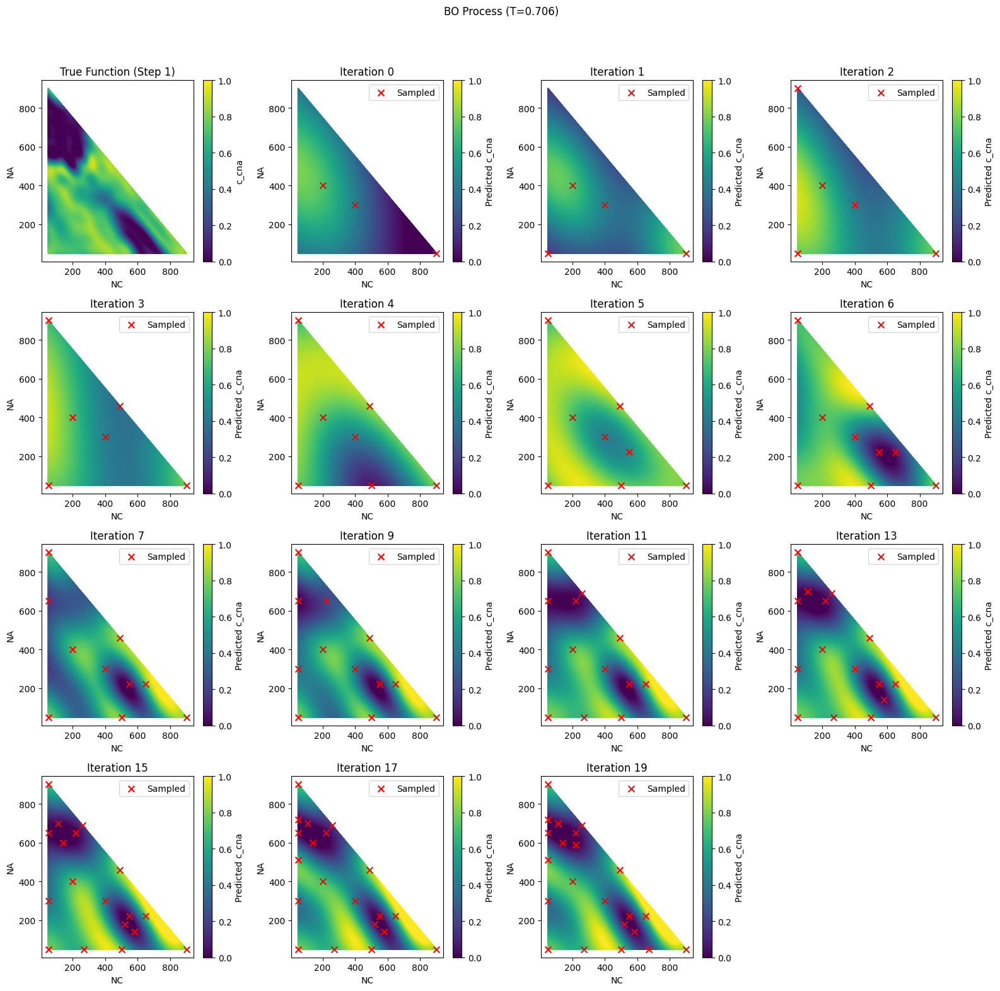

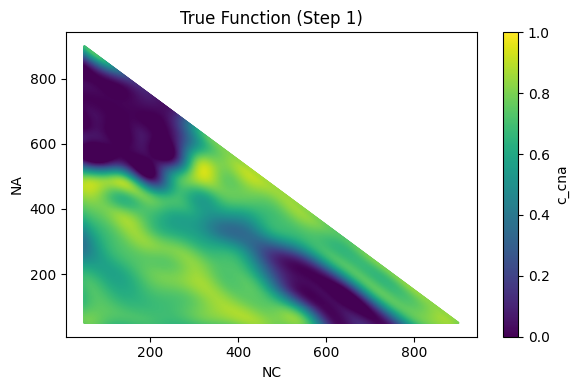

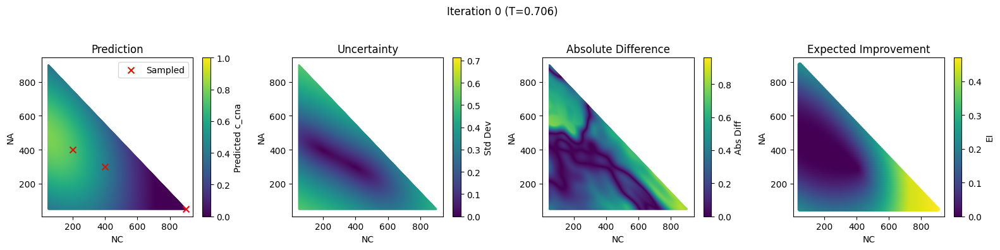

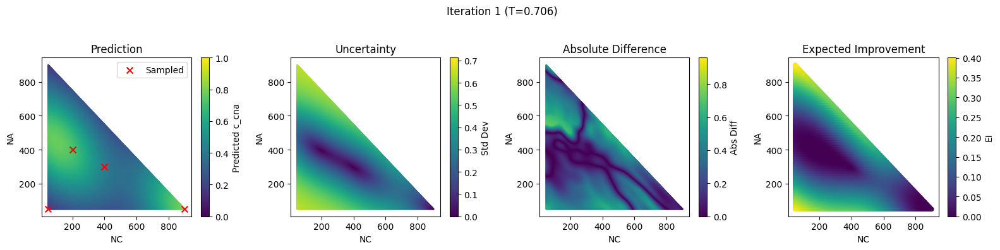

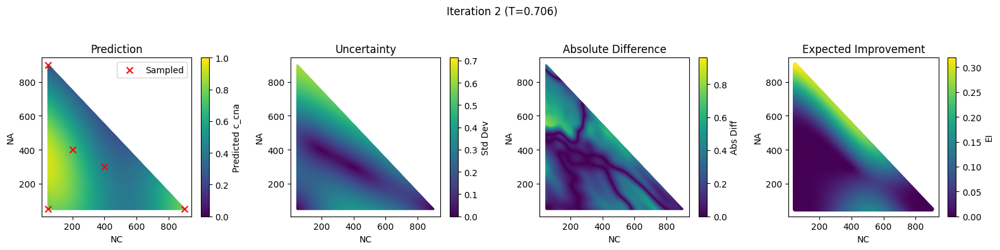

...

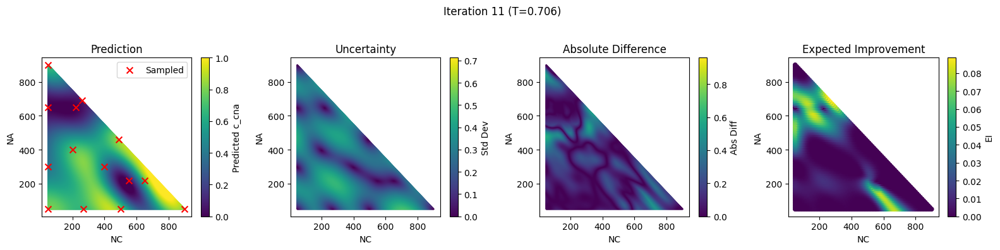

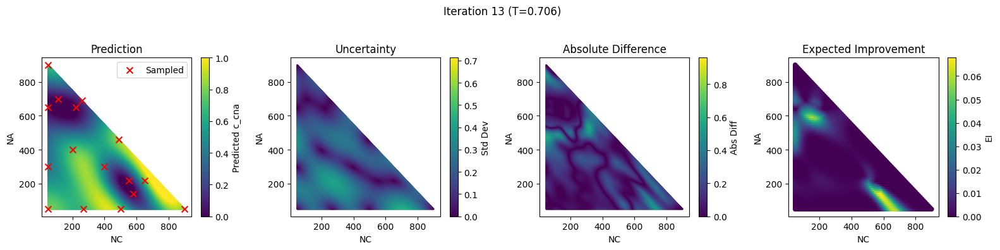

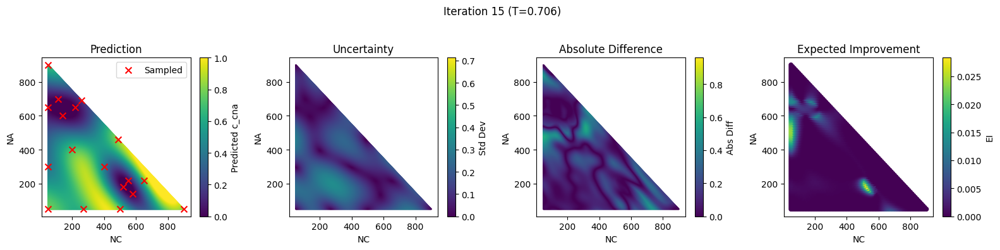

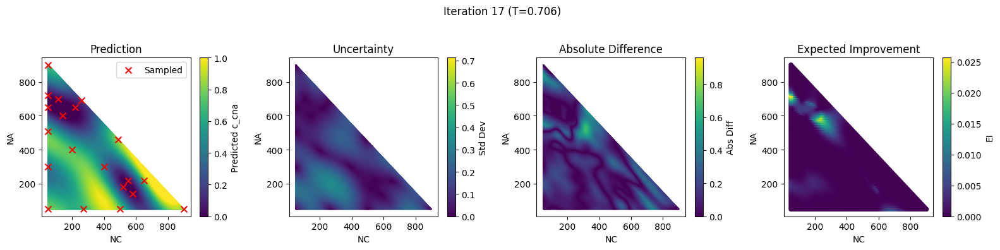

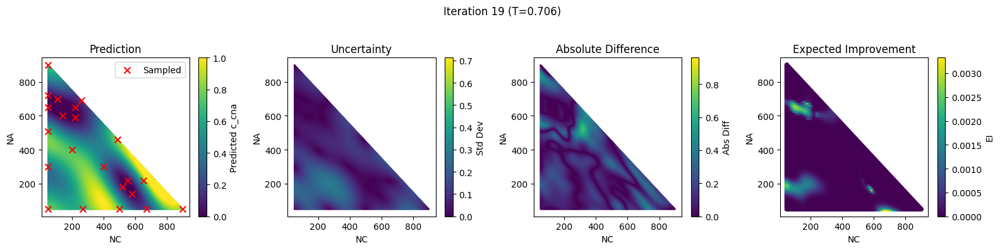

Best configuration: A=650, B=130, C=220, c_cna=0.000000


In [44]:

# --- Execution Block ---
if __name__ == "__main__":
    # Suppress WhiteKernel convergence warnings
    import warnings
    warnings.filterwarnings("ignore", message="The optimal value found for dimension 0 of parameter k2__noise_level")
    
    # Parameters
    temperature = 0.706
    bo_step = 10
    n_iterations = 20
    initial_points = [[400, 400, 200], [300, 300, 400]]
    plot_iterations = [0, 1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 15, 17, 19]
    xi = 0.01
    
    # Load data
    df = load_data()
    
    # Generate configuration spaces
    config_space_step_1 = generate_config_space(step=1, min_val=50, max_val=900)  # For interpolation and visualization
    bo_config_space = generate_config_space(step=bo_step, min_val=50, max_val=900)  # For BO
    
    # Plot interpolation comparison
    #plot_interpolation_comparison(temperature, df, config_space_step_1, save_plots=True)
    
    # Train GPR for BO
    #kernel = ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3)) + WhiteKernel(noise_level=0.0001, noise_level_bounds=(1e-7, 1e-1))
    kernel = ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3)) 
    
    true_gp, X_train_real, y_train_real = train_gpr_interpolator(temperature, df, kernel)
    true_values_step_1 = true_gp.predict(config_space_step_1)
    
    # Run BO
    bo_results = bayesian_optimization(config_space_step_1, bo_config_space, initial_points, 
                                      n_iterations, temperature, df, true_gp, xi)
    
    # Generate BO plots
    plot_bo_process(true_values_step_1, bo_results, config_space_step_1, temperature, plot_iterations, save_plots=False)
    plot_internal_processes(true_values_step_1, bo_results, config_space_step_1, bo_config_space, 
                           temperature, plot_iterations, bo_step, save_plots=False)
    
    # Print best configuration
    best_idx = np.argmin([r['y_train'][-1] for r in bo_results])
    best_point = bo_results[best_idx]['next_point']
    best_value = bo_results[best_idx]['next_y']
    print(f"Best configuration: A={best_point[0]}, B={best_point[1]}, C={best_point[2]}, c_cna={best_value:.6f}")

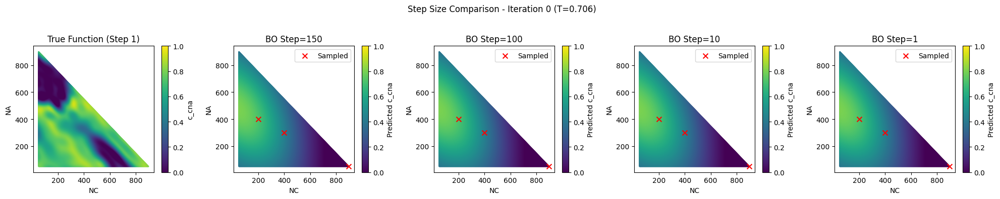

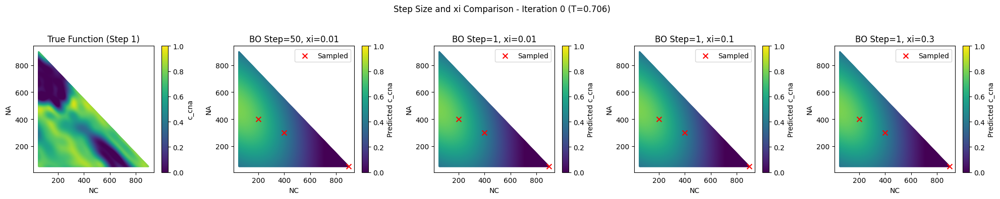

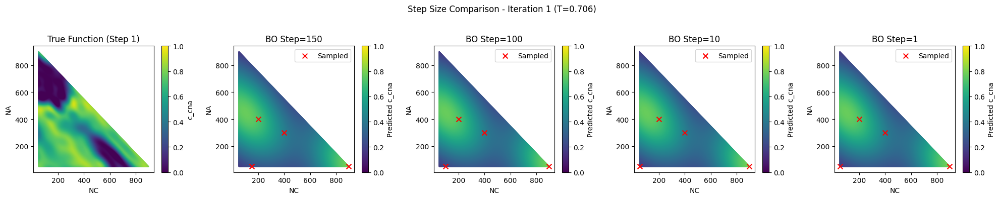

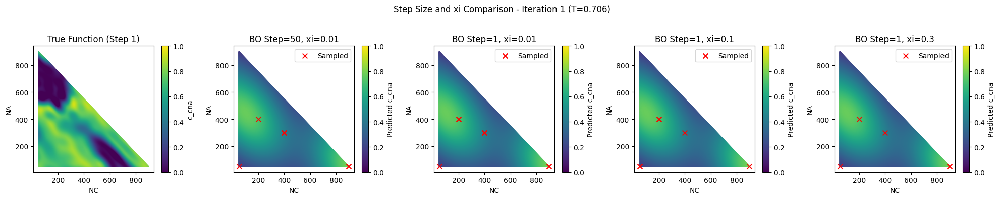

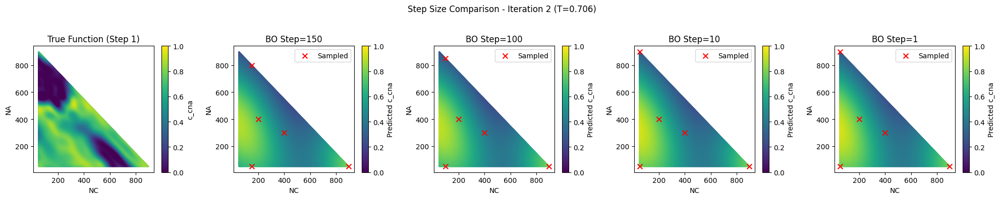

...

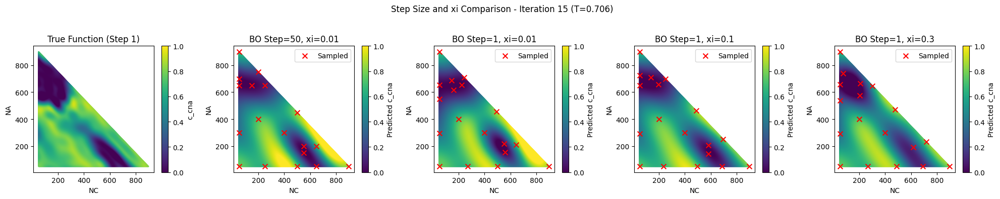

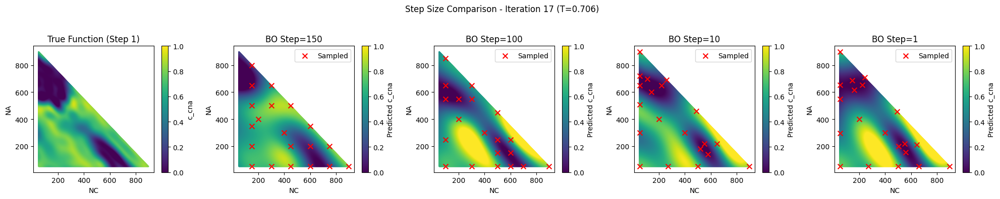

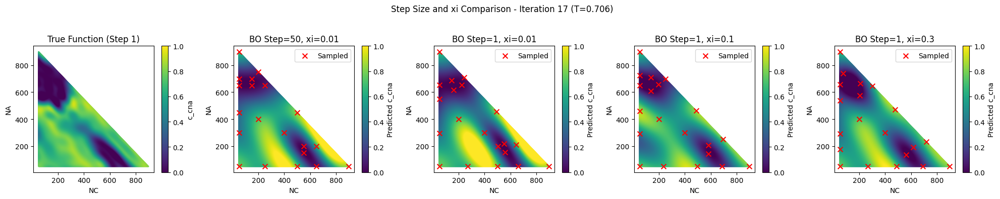

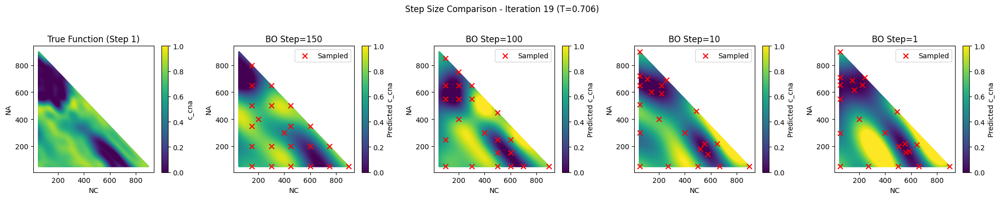

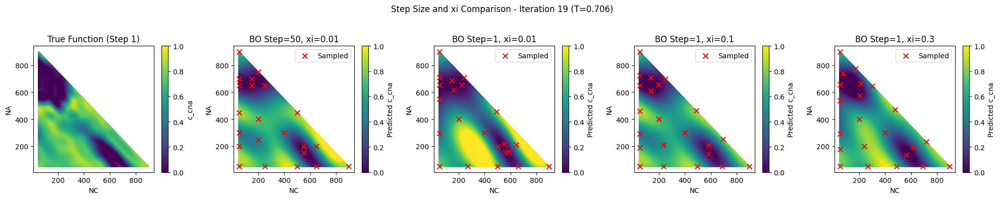


Best Configurations:
Step=150: A=650, B=200, C=150, c_cna=0.003200
Step=100: A=550, B=350, C=100, c_cna=0.001700
Step=10: A=650, B=130, C=220, c_cna=0.000000
Step=1: A=654, B=296, C=50, c_cna=0.000000
Step=50, xi=0.01: A=650, B=300, C=50, c_cna=0.001100
Step=1, xi=0.01: A=654, B=296, C=50, c_cna=0.000000
Step=1, xi=0.1: A=609, B=252, C=139, c_cna=0.000000
Step=1, xi=0.3: A=658, B=292, C=50, c_cna=0.000000


In [45]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, WhiteKernel
from scipy.stats import norm

# --- Data Handling ---
def load_data(file_path="averages_combined.csv"):
    """Load dataset and validate required columns."""
    df = pd.read_csv(file_path)
    required_columns = ['A', 'B', 'C', 'T', 'c_cna']
    if not all(col in df.columns for col in required_columns):
        raise ValueError(f"CSV must contain columns: {required_columns}")
    return df

def generate_config_space(df=None, step=None, min_val=None, max_val=None):
    """
    Generate configuration space for compositions (N_A, N_B, N_C).
    If df is provided, derives unique compositions from data; otherwise, generates grid-based space.
    """
    if df is not None:
        # Extract unique compositions from data
        compositions = df[['A', 'B', 'C']].drop_duplicates().values
        return np.array(compositions)
    
    # Generate grid-based configuration space
    if step is None or min_val is None or max_val is None:
        raise ValueError("Must provide step, min_val, and max_val when df is None")
    
    values = np.arange(min_val, max_val + 1, step)
    config_space = []
    for na in values:
        for nb in values:
            nc = 1000 - na - nb
            if nc >= min_val and nc <= max_val:
                config_space.append([na, nb, nc])
    return np.array(config_space)

def get_averaged_c_cna_data(config_space, temperature, df):
    """Compute averaged c_cna for a given temperature and configuration space."""
    c_cna_values = []
    for na, nb, nc in config_space:
        config_data = df[(df['A'] == na) & 
                        (df['B'] == nb) & 
                        (df['C'] == nc) & 
                        (df['T'] == temperature)]
        mean_c_cna = config_data['c_cna'].mean() if not config_data.empty else np.nan
        c_cna_values.append(mean_c_cna)
    return np.array(c_cna_values)

# --- GPR and Interpolation ---
def train_gpr_interpolator(temperature, df, kernel):
    """Train GPR on all available data for a given temperature with specified kernel."""
    # Group by composition and average c_cna for the given temperature
    data = df[df['T'] == temperature][['A', 'B', 'C', 'c_cna']].groupby(['A', 'B', 'C']).mean().reset_index()
    X_train = data[['A', 'B', 'C']].values
    y_train = data['c_cna'].values
    
    if len(X_train) == 0:
        raise ValueError(f"No data available for temperature {temperature}")
    
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=5)
    gp.fit(X_train, y_train)
    
    # Clamp predictions to [0, 1]
    original_predict = gp.predict
    def clamped_predict(X, return_std=False):
        mu, sigma = original_predict(X, return_std=True)
        mu = np.clip(mu, 0, 1)
        if return_std:
            return mu, sigma
        return mu
    gp.predict = clamped_predict
    
    return gp, X_train, y_train

# --- Bayesian Optimization ---
def expected_improvement(X, gp, best_y, xi):
    """Compute Expected Improvement acquisition function."""
    mu, sigma = gp.predict(X, return_std=True)
    mu = mu.reshape(-1)
    sigma = sigma.reshape(-1)
    
    with np.errstate(divide='warn'):
        Z = (best_y - mu - xi) / sigma
        ei = (best_y - mu - xi) * norm.cdf(Z) + sigma * norm.pdf(Z)
        ei[sigma == 0.0] = 0.0
    
    return ei

def bayesian_optimization(config_space, bo_config_space, initial_points, n_iterations, temperature, df, true_gp, xi):
    """Run Bayesian Optimization with Expected Improvement."""
    X_train = np.array(initial_points)
    y_train = true_gp.predict(X_train)
    
    results = []
    for i in range(n_iterations):
        kernel = ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3))
        gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=5)
        gp.fit(X_train, y_train)
        
        # Clamp predictions to [0, 1]
        original_gp_predict = gp.predict
        def clamped_gp_predict(X, return_std=False):
            mu, sigma = original_gp_predict(X, return_std=True)
            mu = np.clip(mu, 0, 1)
            if return_std:
                return mu, sigma
            return mu
        gp.predict = clamped_gp_predict
        
        best_y = np.min(y_train)
        ei = expected_improvement(bo_config_space, gp, best_y, xi)
        next_idx = np.argmax(ei)
        next_point = bo_config_space[next_idx]
        
        next_y = true_gp.predict([next_point])[0]
        
        mu_step_1, sigma_step_1 = gp.predict(config_space, return_std=True)
        
        X_train = np.vstack([X_train, next_point])
        y_train = np.append(y_train, next_y)
        
        results.append({
            'iteration': i,
            'X_train': X_train.copy(),
            'y_train': y_train.copy(),
            'mu_step_1': mu_step_1,
            'sigma_step_1': sigma_step_1,
            'ei': ei,
            'next_point': next_point,
            'next_y': next_y
        })
    
    return results

# --- Plotting Utilities ---
def plot_scatter(ax, x, y, c, s=0.2, cmap='viridis', vmin=None, vmax=None, sampled_points=None, label=None):
    """Create a scatter plot on the given axis with optional sampled points."""
    valid = ~np.isnan(c)
    sc = None
    if np.any(valid):
        sc = ax.scatter(x[valid], y[valid], c=c[valid], s=s, cmap=cmap, vmin=vmin, vmax=vmax)
    
    if sampled_points is not None and label:
        x_samp, y_samp = sampled_points
        ax.scatter(x_samp, y_samp, c='red', marker='x', s=50, label=label)
        ax.legend()
    
    return sc

def add_colorbar(fig, ax, sc, label):
    """Add a colorbar to the figure for the given scatter plot."""
    if sc is not None:
        fig.colorbar(sc, ax=ax, label=label)

def format_axes(ax, xlabel='NC', ylabel='NA', title=''):
    """Format axes with labels and title."""
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

# --- Interpolation Comparison Plot ---
def plot_interpolation_comparison(temperature, df, config_space_step_1, output_dir='plots', save_plots=True):
    """Plot raw data and interpolations with different GPR kernels in a 2x2 figure."""
    vmin, vmax = 0, 1
    marker_size = 0.2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Initialize 2x2 subplot figure
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.flatten()
    
    # Plot 1: Raw data (no interpolation)
    data = df[df['T'] == temperature][['A', 'B', 'C', 'c_cna']].groupby(['A', 'B', 'C']).mean().reset_index()
    X_raw = data[['A', 'B', 'C']].values
    y_raw = data['c_cna'].values
    ax = axes[0]
    sc = plot_scatter(ax, X_raw[:, 2], X_raw[:, 0], y_raw, s=200, vmin=vmin, vmax=vmax)
    add_colorbar(fig, ax, sc, 'c_cna')
    format_axes(ax, title='Raw Data')
    
    # Define kernels for interpolation
    kernels = [
        # Kernel 1: No WhiteKernel
        ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3)),
        # Kernel 2: With WhiteKernel (default parameters)
        ConstantKernel(1.0) * RBF(length_scale=50, length_scale_bounds=(1e-2, 1e3)) + 
        WhiteKernel(noise_level=0.000001, noise_level_bounds=(1e-8, 1e-1)),
        # Kernel 3: With WhiteKernel (different parameters)
        ConstantKernel(1.0) * RBF(length_scale=50, length_scale_bounds=(1e-1, 1e3)) + 
        WhiteKernel(noise_level=0.001, noise_level_bounds=(1e-6, 1e-2))
    ]
    kernel_titles = [
        'Interpolation: RBF Only',
        'Interpolation: RBF + WhiteKernel (noise=0.0001)',
        'Interpolation: RBF + WhiteKernel (noise=0.001, length_scale=50)'
    ]
    
    # Plots 2-4: Interpolations with different kernels
    for i, (kernel, title) in enumerate(zip(kernels[0:3], kernel_titles), start=1):
        ax = axes[i]
        gp, _, _ = train_gpr_interpolator(temperature, df, kernel)
        y_pred = gp.predict(config_space_step_1)
        sc = plot_scatter(ax, config_space_step_1[:, 2], config_space_step_1[:, 0], y_pred, 
                         s=marker_size, vmin=vmin, vmax=vmax)
        add_colorbar(fig, ax, sc, 'c_cna')
        format_axes(ax, title=title)
    
    # Adjust layout and save
    plt.suptitle(f'Interpolation Comparison (T={temperature})')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if save_plots:
        plt.savefig(os.path.join(output_dir, 'interpolation_comparison.png'), dpi=300)
    plt.show()
    plt.close()

# --- Task 1: Simple BO Process Visualization ---
def plot_bo_process(true_values, bo_results, config_space, temperature, plot_iterations, output_dir='plots', save_plots=True):
    """Plot true function and BO predictions across iterations."""
    vmin, vmax = 0, 1
    marker_size = 0.2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Determine subplot grid (4 plots per row)
    n_plots = len(plot_iterations) + 1  # True function + iterations
    ncols = 4
    nrows = int(np.ceil(n_plots / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))
    axes = axes.flatten()
    
    # Plot true function
    ax = axes[0]
    sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], true_values, 
                     s=marker_size, vmin=vmin, vmax=vmax)
    add_colorbar(fig, ax, sc, 'c_cna')
    format_axes(ax, title='True Function (Step 1)')
    
    # Plot BO predictions
    for i, iter_idx in enumerate(plot_iterations):
        ax = axes[i + 1]
        result = bo_results[iter_idx]
        mu_step_1 = result['mu_step_1']
        X_train = result['X_train']
        
        sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], mu_step_1, 
                         s=marker_size, vmin=vmin, vmax=vmax, 
                         sampled_points=(X_train[:, 2], X_train[:, 0]), label='Sampled')
        add_colorbar(fig, ax, sc, 'Predicted c_cna')
        format_axes(ax, title=f'Iteration {iter_idx}')
    
    # Remove empty subplots
    for j in range(n_plots, len(axes)):
        fig.delaxes(axes[j])
    
    plt.suptitle(f'BO Process (T={temperature})')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if save_plots:
        plt.savefig(os.path.join(output_dir, 'task1_bo_predictions.png'), dpi=300)
    plt.show()
    plt.close()

# --- Task 2: Internal Processes Visualization ---
def plot_internal_processes(true_values, bo_results, config_space, bo_config_space, temperature, plot_iterations, bo_step, output_dir='plots', save_plots=True):
    """Plot prediction, uncertainty, absolute difference, and EI for each iteration."""
    vmin_pred, vmax_pred = 0, 1
    marker_size_step_1 = 0.2
    marker_size_bo = 20 * (bo_step / 10) ** 2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Compute global scales for consistency (excluding EI)
    max_sigma = max([np.max(r['sigma_step_1']) for r in bo_results])
    max_abs_diff = max([np.max(np.abs(r['mu_step_1'] - true_values)) for r in bo_results])
    
    # Plot true function (separate figure)
    fig, ax = plt.subplots(figsize=(6, 4))
    sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], true_values, 
                     s=marker_size_step_1, vmin=vmin_pred, vmax=vmax_pred)
    add_colorbar(fig, ax, sc, 'c_cna')
    format_axes(ax, title='True Function (Step 1)')
    plt.tight_layout()
    if save_plots:
        plt.savefig(os.path.join(output_dir, 'task2_true_function.png'), dpi=300)
    plt.show()
    plt.close()
    
    # Plot internal processes for each iteration
    for iter_idx in plot_iterations:
        result = bo_results[iter_idx]
        mu_step_1 = result['mu_step_1']
        sigma_step_1 = result['sigma_step_1']
        ei = result['ei']
        X_train = result['X_train']
        
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 4))
        
        # Prediction
        sc = plot_scatter(ax1, config_space[:, 2], config_space[:, 0], mu_step_1, 
                         s=marker_size_step_1, vmin=vmin_pred, vmax=vmax_pred, 
                         sampled_points=(X_train[:, 2], X_train[:, 0]), label='Sampled')
        add_colorbar(fig, ax1, sc, 'Predicted c_cna')
        format_axes(ax1, title='Prediction')
        
        # Uncertainty
        sc = plot_scatter(ax2, config_space[:, 2], config_space[:, 0], sigma_step_1, 
                         s=marker_size_step_1, vmin=0, vmax=max_sigma)
        add_colorbar(fig, ax2, sc, 'Std Dev')
        format_axes(ax2, title='Uncertainty')
        
        # Absolute Difference
        abs_diff = np.abs(mu_step_1 - true_values)
        sc = plot_scatter(ax3, config_space[:, 2], config_space[:, 0], abs_diff, 
                         s=marker_size_step_1, vmin=0, vmax=max_abs_diff)
        add_colorbar(fig, ax3, sc, 'Abs Diff')
        format_axes(ax3, title='Absolute Difference')
        
        # Expected Improvement (individual color scale)
        sc = plot_scatter(ax4, bo_config_space[:, 2], bo_config_space[:, 0], ei, 
                         s=marker_size_bo, vmin=np.min(ei), vmax=np.max(ei))
        add_colorbar(fig, ax4, sc, 'EI')
        format_axes(ax4, title='Expected Improvement')
        
        plt.suptitle(f'Iteration {iter_idx} (T={temperature})')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        if save_plots:
            plt.savefig(os.path.join(output_dir, f'task2_internal_iter_{iter_idx}.png'), dpi=300)
        plt.show()
        plt.close()

# --- Task 3: BO Comparison with Different Parameters ---
def plot_bo_comparison(true_values, bo_results_list, config_space, temperature, plot_iterations, output_dir='plots', save_plots=True):
    """Plot BO predictions for different grid step sizes and xi values across iterations."""
    vmin, vmax = 0, 1
    marker_size = 0.2
    
    # Create output directory if saving plots
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Titles for the two sets of plots
    step_titles = [
        'True Function (Step 1)',
        'BO Step=150',
        'BO Step=100',
        'BO Step=10',
        'BO Step=1'
    ]
    xi_titles = [
        'True Function (Step 1)',
        'BO Step=50, xi=0.01',
        'BO Step=1, xi=0.01',
        'BO Step=1, xi=0.1',
        'BO Step=1, xi=0.3'
    ]
    
    # Plot for each iteration
    for iter_idx in plot_iterations:
        # First set: Step size comparison
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        axes = axes.flatten()
        
        # Plot true function
        ax = axes[0]
        sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], true_values, 
                         s=marker_size, vmin=vmin, vmax=vmax)
        add_colorbar(fig, ax, sc, 'c_cna')
        format_axes(ax, title=step_titles[0])
        
        # Plot BO predictions for different step sizes
        for i, (bo_results, title) in enumerate(zip(bo_results_list[:4], step_titles[1:]), start=1):
            ax = axes[i]
            result = bo_results[iter_idx]
            mu_step_1 = result['mu_step_1']
            X_train = result['X_train']
            
            sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], mu_step_1, 
                             s=marker_size, vmin=vmin, vmax=vmax, 
                             sampled_points=(X_train[:, 2], X_train[:, 0]), label='Sampled')
            add_colorbar(fig, ax, sc, 'Predicted c_cna')
            format_axes(ax, title=title)
        
        plt.suptitle(f'Step Size Comparison - Iteration {iter_idx} (T={temperature})')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        if save_plots:
            plt.savefig(os.path.join(output_dir, f'task3_step_comparison_iter_{iter_idx}.png'), dpi=300)
        plt.show()
        plt.close()
        
        # Second set: Step size and xi comparison
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        axes = axes.flatten()
        
        # Plot true function
        ax = axes[0]
        sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], true_values, 
                         s=marker_size, vmin=vmin, vmax=vmax)
        add_colorbar(fig, ax, sc, 'c_cna')
        format_axes(ax, title=xi_titles[0])
        
        # Plot BO predictions for different step sizes and xi
        for i, (bo_results, title) in enumerate(zip(bo_results_list[4:], xi_titles[1:]), start=1):
            ax = axes[i]
            result = bo_results[iter_idx]
            mu_step_1 = result['mu_step_1']
            X_train = result['X_train']
            
            sc = plot_scatter(ax, config_space[:, 2], config_space[:, 0], mu_step_1, 
                             s=marker_size, vmin=vmin, vmax=vmax, 
                             sampled_points=(X_train[:, 2], X_train[:, 0]), label='Sampled')
            add_colorbar(fig, ax, sc, 'Predicted c_cna')
            format_axes(ax, title=title)
        
        plt.suptitle(f'Step Size and xi Comparison - Iteration {iter_idx} (T={temperature})')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        if save_plots:
            plt.savefig(os.path.join(output_dir, f'task3_xi_comparison_iter_{iter_idx}.png'), dpi=300)
        plt.show()
        plt.close()

# --- Execution Block ---
if __name__ == "__main__":
    # Suppress WhiteKernel convergence warnings
    import warnings
    warnings.filterwarnings("ignore", message="The optimal value found for dimension 0 of parameter k2__noise_level")
    
    # Parameters
    temperature = 0.706
    bo_step = 10
    n_iterations = 20
    initial_points = [[400, 400, 200], [300, 300, 400]]
    plot_iterations = [0, 1, 2, 3, 4, 5, 6, 7, 9, 11, 13, 15, 17, 19]
    xi = 0.01
    
    # Load data
    df = load_data()
    
    # Generate configuration spaces
    config_space_step_1 = generate_config_space(step=1, min_val=50, max_val=900)  # For interpolation and visualization
    
    # Train GPR for BO
    kernel = ConstantKernel(1.0) * RBF(length_scale=100, length_scale_bounds=(1e-2, 1e3))
    true_gp, X_train_real, y_train_real = train_gpr_interpolator(temperature, df, kernel)
    true_values_step_1 = true_gp.predict(config_space_step_1)
    
    # Task 3: Compare BO with different parameters
    step_sizes = [150, 100, 10, 1]
    xi_configs = [
        {'step': 50, 'xi': 0.01},
        {'step': 1, 'xi': 0.01},
        {'step': 1, 'xi': 0.1},
        {'step': 1, 'xi': 0.3}
    ]
    
    bo_results_list = []
    best_configs = []
    
    # Run BO for different step sizes
    for step in step_sizes:
        bo_config_space = generate_config_space(step=step, min_val=50, max_val=900)
        bo_results = bayesian_optimization(config_space_step_1, bo_config_space, initial_points, 
                                          n_iterations, temperature, df, true_gp, xi=0.01)
        bo_results_list.append(bo_results)
        
        # Find best configuration
        best_idx = np.argmin([r['y_train'][-1] for r in bo_results])
        best_point = bo_results[best_idx]['next_point']
        best_value = bo_results[best_idx]['next_y']
        best_configs.append({
            'config': f'Step={step}',
            'A': best_point[0],
            'B': best_point[1],
            'C': best_point[2],
            'c_cna': best_value
        })
    
    # Run BO for different step sizes and xi
    for config in xi_configs:
        bo_config_space = generate_config_space(step=config['step'], min_val=50, max_val=900)
        bo_results = bayesian_optimization(config_space_step_1, bo_config_space, initial_points, 
                                          n_iterations, temperature, df, true_gp, xi=config['xi'])
        bo_results_list.append(bo_results)
        
        # Find best configuration
        best_idx = np.argmin([r['y_train'][-1] for r in bo_results])
        best_point = bo_results[best_idx]['next_point']
        best_value = bo_results[best_idx]['next_y']
        best_configs.append({
            'config': f'Step={config["step"]}, xi={config["xi"]}',
            'A': best_point[0],
            'B': best_point[1],
            'C': best_point[2],
            'c_cna': best_value
        })
    
    # Plot BO comparisons
    plot_bo_comparison(true_values_step_1, bo_results_list, config_space_step_1, temperature, 
                       plot_iterations, save_plots=True)
    
    # Print best configurations
    print("\nBest Configurations:")
    for config in best_configs:
        print(f"{config['config']}: A={config['A']}, B={config['B']}, C={config['C']}, c_cna={config['c_cna']:.6f}")